In [111]:
image_name="my_image1.png"

function used to visulise the images at intermediate steps

In [112]:
import pandas as pd
import numpy as np
from PIL import Image
import math

def df_to_image(df, output_path="output_image.png"):
    # Ensure only RGB columns and convert to uint8
    pixels = df[['Red', 'Green', 'Blue']].to_numpy(dtype=np.uint8)
    
    # Number of pixels
    N = len(pixels)
    
    # Find dimensions (nearest square if possible)
    width = int(math.sqrt(N))
    height = N // width
    
    if width * height != N:
        raise ValueError(f"Pixel count {N} does not fit perfectly into {width}x{height} image.")
    
    # Reshape into (height, width, 3)
    pixels = pixels.reshape((height, width, 3))
    
    # Create and save image
    img = Image.fromarray(pixels, 'RGB')
    img.save(output_path)
    img.show()
    print(f"Image saved as {output_path}")

Picture Loading

In [113]:
import cv2 
img = cv2.imread(image_name)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
print(img.shape)
img

(210, 210, 3)


array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[ 2,  2,  2],
        [ 7,  7,  7],
        [11, 11, 11],
        ...,
        [ 4,  4,  4],
        [ 4,  4,  4],
        [ 3,  3,  3]],

       [[ 5,  5,  5],
        [12, 12, 12],
        [14, 14, 14],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[ 6,  6,  6],
        [12, 12, 12],
        [14, 14, 14],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)

In [114]:
img_rows=img.shape[0]
img_columns=img.shape[1]
total_pixels=img_rows*img_columns
print(img[img.shape[0]-1][img.shape[1]-1])
print(img[img_rows-1][img_columns-1])
print(f"No. of Rows in the Img Matrix : {img_rows}")
print(f"No. of Columns in Img matrix : {img_columns}")
print(f"Total No. of Pixels in Img : {total_pixels}")
red_values = [] ; green_values=[] ; blue_values =[]
for row in range(img_rows):#Rows in img matrix
    for column in range(img_columns):#columns in img matrix
        red_values.append(img[row][column][0])#Red value of Pixel
        green_values.append(img[row][column][1])#Green value of Pixel
        blue_values.append(img[row][column][2])#Blue value of Pixel
print(len(red_values))
print(len(green_values))
print(len(blue_values))
import pandas as pd
picture_df = pd.DataFrame({'Red':red_values,'Green':green_values,'Blue':blue_values})
picture_df

[0 0 0]
[0 0 0]
No. of Rows in the Img Matrix : 210
No. of Columns in Img matrix : 210
Total No. of Pixels in Img : 44100
44100
44100
44100


,Red,Green,Blue
0,0,0,0
1,0,0,0
2,0,0,0
3,0,0,0
4,0,0,0
...,...,...,...
44095,0,0,0
44096,0,0,0
44097,0,0,0
44098,0,0,0


Redraw the image from extrated data to check the data extration quality

In [115]:
img_df = pd.DataFrame()
img_df['Red']=picture_df['Red']
img_df['Green']=picture_df['Green']
img_df['Blue']=picture_df['Blue']
output_path=image_name.split(".")[0]+"_redrawn.png"
df_to_image(img_df, output_path=output_path)

Image saved as my_image1_redrawn.png


Creating Logistic Map

In [116]:
import math
def intertwin_3d_iterator(x_n,y_n,z_n,mue,k1,k2,k3):
    x_n_plus_1=(mue*k1*y_n*(1-x_n)+z_n)%1
    y_n_plus_1=(mue*k2*y_n + z_n*(1+(x_n_plus_1)**2))%1
    z_n_plus_1=(mue*(y_n_plus_1+x_n_plus_1+k3)*math.sin(z_n))%1
    return x_n_plus_1, y_n_plus_1, z_n_plus_1

In [117]:
#initial parameters (have exact values as referred in the paper see fig 1a in JISA paper)
x_n = 0.361
y_n=0.259
z_n= 0.785
#constants used in the given equation 
mue=3.999
k1=34.913
k2=38.942
k3=36.709

In [118]:
steps=[]; x_values=[] ; y_values= []; z_values = [] 

for i in range((img_rows*img_columns)+ 10000):#initial 10000 iterations are transient iterations (its values are not used)
    #store current values (Keystream)
    if(i<10000):
        continue
    steps.append(i)
    x_values.append(x_n)
    y_values.append(y_n)
    z_values.append(z_n)
    #update keystream
    x_n_plus_1 , y_n_plus_1 , z_n_plus_1 = intertwin_3d_iterator(x_n,y_n,z_n,mue,k1,k2,k3)
    x_n=x_n_plus_1
    y_n=y_n_plus_1
    z_n=z_n_plus_1
#dataframe creation
import pandas as pd
logistic_map_df=pd.DataFrame()
logistic_map_df["Steps"]=steps
logistic_map_df["X"]=x_values
logistic_map_df["Y"]=y_values
logistic_map_df["Z"]=z_values

print(logistic_map_df["X"].max())
print(logistic_map_df["Y"].max())
print(logistic_map_df["Z"].max())
print(logistic_map_df["X"].min())
print(logistic_map_df["Y"].min())
print(logistic_map_df["Z"].min())
logistic_map_df

0.9999985903243953
0.999995525211375
0.9999941538526542
7.260509427453599e-06
1.918244372944855e-05
2.8339175358382818e-05


,Steps,X,Y,Z
0,10000,0.361000,0.259000,0.785000
1,10001,0.891768,0.743097,0.382533
2,10002,0.611545,0.247348,0.078047
3,10003,0.492953,0.616256,0.791442
4,10004,0.417638,0.898408,0.172082
...,...,...,...,...
44095,54095,0.874777,0.475185,0.124989
44096,54096,0.432781,0.148561,0.590332
44097,54097,0.355419,0.800219,0.286375
44098,54098,0.301728,0.929762,0.858452


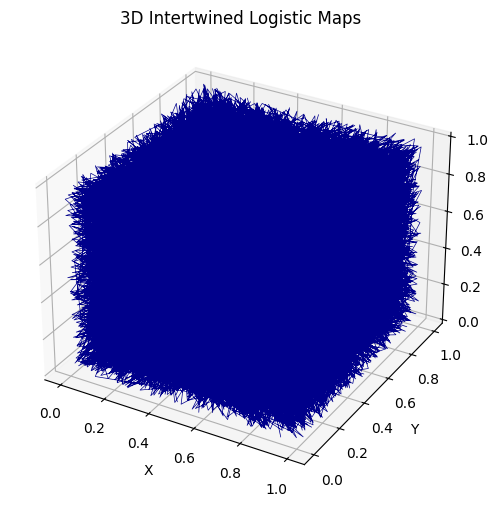

In [119]:
import numpy as np
import matplotlib.pyplot as plt
# Plot in 3D
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
ax.plot3D(logistic_map_df['X'], logistic_map_df['Y'] , logistic_map_df["Z"], color='darkblue', lw=0.5)

ax.set_title("3D Intertwined Logistic Maps")
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")
plt.show()


In [120]:
import numpy as np
import plotly.express as px
import pandas as pd
# Create dataframe for Plotly Express
plot_df = pd.DataFrame({"X": logistic_map_df['X'], "Y": logistic_map_df['Y'], "Z": logistic_map_df['Z'], "Step": logistic_map_df['Steps']})

# Interactive 3D scatter plot with continuous color
fig = px.scatter_3d(plot_df, x="X", y="Y", z="Z", color="Step",
                    color_continuous_scale="Viridis",
                    title="3D Intertwined Logistic Maps (Interactive)",
                    size_max=2)
fig.show()


In [121]:
#Note all values from the itertwined logistic maps are btw [0,1]
# All logistic values are scalled to be in btw [0,255] 
logistic_map_df['X_Scalled'] = (logistic_map_df['X'] * 255).round().astype(int)
logistic_map_df['Y_Scalled'] = (logistic_map_df["Y"] * 255).round().astype(int)
logistic_map_df['Z_Scalled'] = (logistic_map_df["Z"] * 255).round().astype(int)

print(logistic_map_df['X_Scalled'].max())
print(logistic_map_df['Y_Scalled'].max())
print(logistic_map_df['Z_Scalled'].max())
print(logistic_map_df['X_Scalled'].min())
print(logistic_map_df['Y_Scalled'].min())
print(logistic_map_df['Z_Scalled'].min())
logistic_map_df


255
255
255
0
0
0


,Steps,X,Y,Z,X_Scalled,Y_Scalled,Z_Scalled
0,10000,0.361000,0.259000,0.785000,92,66,200
1,10001,0.891768,0.743097,0.382533,227,189,98
2,10002,0.611545,0.247348,0.078047,156,63,20
3,10003,0.492953,0.616256,0.791442,126,157,202
4,10004,0.417638,0.898408,0.172082,106,229,44
...,...,...,...,...,...,...,...
44095,54095,0.874777,0.475185,0.124989,223,121,32
44096,54096,0.432781,0.148561,0.590332,110,38,151
44097,54097,0.355419,0.800219,0.286375,91,204,73
44098,54098,0.301728,0.929762,0.858452,77,237,219


Adding Picture Data in Logistic map df 

In [122]:
logistic_map_df['Red']=picture_df['Red']
logistic_map_df['Green']=picture_df['Green']
logistic_map_df['Blue']=picture_df['Blue']
logistic_map_df

,Steps,X,Y,Z,X_Scalled,Y_Scalled,Z_Scalled,Red,Green,Blue
0,10000,0.361000,0.259000,0.785000,92,66,200,0,0,0
1,10001,0.891768,0.743097,0.382533,227,189,98,0,0,0
2,10002,0.611545,0.247348,0.078047,156,63,20,0,0,0
3,10003,0.492953,0.616256,0.791442,126,157,202,0,0,0
4,10004,0.417638,0.898408,0.172082,106,229,44,0,0,0
...,...,...,...,...,...,...,...,...,...,...
44095,54095,0.874777,0.475185,0.124989,223,121,32,0,0,0
44096,54096,0.432781,0.148561,0.590332,110,38,151,0,0,0
44097,54097,0.355419,0.800219,0.286375,91,204,73,0,0,0
44098,54098,0.301728,0.929762,0.858452,77,237,219,0,0,0


Mixing Starts here

In [123]:
#bitwise Xor
logistic_map_df['Xor_Red']=logistic_map_df['X_Scalled']^logistic_map_df['Red']
logistic_map_df['Xor_Green']=logistic_map_df['Y_Scalled']^logistic_map_df['Green']
logistic_map_df['Xor_Blue']=logistic_map_df['Z_Scalled']^logistic_map_df['Blue']

print(logistic_map_df['Xor_Red'].max())
print(logistic_map_df['Xor_Green'].max())
print(logistic_map_df['Xor_Blue'].max())
print(logistic_map_df['Xor_Red'].min())
print(logistic_map_df['Xor_Green'].min())
print(logistic_map_df['Xor_Blue'].min())
logistic_map_df

255
255
255
0
0
0


,Steps,X,Y,Z,X_Scalled,Y_Scalled,Z_Scalled,Red,Green,Blue,Xor_Red,Xor_Green,Xor_Blue
0,10000,0.361000,0.259000,0.785000,92,66,200,0,0,0,92,66,200
1,10001,0.891768,0.743097,0.382533,227,189,98,0,0,0,227,189,98
2,10002,0.611545,0.247348,0.078047,156,63,20,0,0,0,156,63,20
3,10003,0.492953,0.616256,0.791442,126,157,202,0,0,0,126,157,202
4,10004,0.417638,0.898408,0.172082,106,229,44,0,0,0,106,229,44
...,...,...,...,...,...,...,...,...,...,...,...,...,...
44095,54095,0.874777,0.475185,0.124989,223,121,32,0,0,0,223,121,32
44096,54096,0.432781,0.148561,0.590332,110,38,151,0,0,0,110,38,151
44097,54097,0.355419,0.800219,0.286375,91,204,73,0,0,0,91,204,73
44098,54098,0.301728,0.929762,0.858452,77,237,219,0,0,0,77,237,219


Xored Image checking

In [124]:
img_df = pd.DataFrame()
img_df['Red']=logistic_map_df['Xor_Red']
img_df['Green']=logistic_map_df['Xor_Green']
img_df['Blue']=logistic_map_df['Xor_Blue']
output_path=image_name.split(".")[0]+"_XORed.png"
df_to_image(img_df, output_path=output_path)

Image saved as my_image1_XORed.png


Bitwise xor is reversel i.e. (A^K^)k=A using this trying a simple decryption 

In [125]:
logistic_map_df["XOR_reversed_Red"]=logistic_map_df['Xor_Red']^logistic_map_df['X_Scalled']
logistic_map_df["XOR_reversed_Green"]=logistic_map_df['Xor_Green']^logistic_map_df['Y_Scalled']
logistic_map_df["XOR_reversed_Blue"]=logistic_map_df['Xor_Blue']^logistic_map_df['Z_Scalled']
logistic_map_df

,Steps,X,Y,Z,X_Scalled,Y_Scalled,Z_Scalled,Red,Green,Blue,Xor_Red,Xor_Green,Xor_Blue,XOR_reversed_Red,XOR_reversed_Green,XOR_reversed_Blue
0,10000,0.361000,0.259000,0.785000,92,66,200,0,0,0,92,66,200,0,0,0
1,10001,0.891768,0.743097,0.382533,227,189,98,0,0,0,227,189,98,0,0,0
2,10002,0.611545,0.247348,0.078047,156,63,20,0,0,0,156,63,20,0,0,0
3,10003,0.492953,0.616256,0.791442,126,157,202,0,0,0,126,157,202,0,0,0
4,10004,0.417638,0.898408,0.172082,106,229,44,0,0,0,106,229,44,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44095,54095,0.874777,0.475185,0.124989,223,121,32,0,0,0,223,121,32,0,0,0
44096,54096,0.432781,0.148561,0.590332,110,38,151,0,0,0,110,38,151,0,0,0
44097,54097,0.355419,0.800219,0.286375,91,204,73,0,0,0,91,204,73,0,0,0
44098,54098,0.301728,0.929762,0.858452,77,237,219,0,0,0,77,237,219,0,0,0


Shuffling (Horizontal + vertical ) reduced corealtion of xored pixels, more secure

image matrix from eaxtrated data

In [95]:
# import math 
# import numpy as np 
# red_values=list(logistic_map_df["Red"])
# green_values=list(logistic_map_df["Green"])
# blue_values=list(logistic_map_df["Blue"])
# print(len(red_values))
# print(len(green_values))
# print(len(blue_values))
# size = int(math.sqrt(len(red_values)))
# print(size)

# simple_original_matrix=np.zeros((size,size,3),dtype=np.uint8)
# print(simple_original_matrix.shape)
# simple_original_matrix

# for i in range(len(red_values)):
#     row=int(i/size)
#     col=i%size
#     # print(f"row: {row} , col: {col} , {simple_original_matrix[row][col]}")#use this line to check only 
#     simple_original_matrix[row][col][0]=red_values[i]
#     simple_original_matrix[row][col][1]=green_values[i]
#     simple_original_matrix[row][col][2]=blue_values[i]
# print(simple_original_matrix.shape)

# img = Image.fromarray(simple_original_matrix, 'RGB')
# img.show()
# simple_original_matrix

44100
44100
44100
210
(210, 210, 3)
(210, 210, 3)


array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[ 2,  2,  2],
        [ 7,  7,  7],
        [11, 11, 11],
        ...,
        [ 4,  4,  4],
        [ 4,  4,  4],
        [ 3,  3,  3]],

       [[ 5,  5,  5],
        [12, 12, 12],
        [14, 14, 14],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[ 6,  6,  6],
        [12, 12, 12],
        [14, 14, 14],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)

Xored Image matrix

In [126]:
import math 
import numpy as np 
xor_red_values=list(logistic_map_df["Xor_Red"])
xor_green_values=list(logistic_map_df['Xor_Green'])
xor_blue_values=list(logistic_map_df['Xor_Blue'])
print(len(xor_red_values))
print(len(xor_green_values))
print(len(xor_blue_values))
size = int(math.sqrt(len(xor_red_values)))
print(size)

simple_xored_cipher_matrix=np.zeros((size,size,3),dtype=np.uint8)
print(simple_xored_cipher_matrix.shape)
simple_xored_cipher_matrix

for i in range(len(xor_red_values)):
    row=int(i/size)
    col=i%size
    # print(f"row: {row} , col: {col} , {simple_xored_cipher_matrix[row][col]}")#use this line to check only 
    simple_xored_cipher_matrix[row][col][0]=xor_red_values[i]
    simple_xored_cipher_matrix[row][col][1]=xor_green_values[i]
    simple_xored_cipher_matrix[row][col][2]=xor_blue_values[i]
print(simple_xored_cipher_matrix.shape)
img = Image.fromarray(simple_xored_cipher_matrix, 'RGB')
img.show()
simple_xored_cipher_matrix

44100
44100
44100
210
(210, 210, 3)
(210, 210, 3)


array([[[ 92,  66, 200],
        [227, 189,  98],
        [156,  63,  20],
        ...,
        [239, 205, 166],
        [182,  68,  86],
        [250,   0,  28]],

       [[ 28,  40,  46],
        [141, 134,  49],
        [243,  69, 187],
        ...,
        [ 19,   5, 185],
        [120,  49,  68],
        [120,  72, 129]],

       [[ 68,  82,  84],
        [112, 181,  51],
        [207, 189, 163],
        ...,
        [234, 215, 114],
        [ 27, 246,  28],
        [205, 175, 215]],

       ...,

       [[ 46, 251, 250],
        [209, 189, 139],
        [216,  52,   0],
        ...,
        [202, 163, 244],
        [ 99,  65, 189],
        [ 63, 234,  85]],

       [[  3, 173, 116],
        [ 59,   2,  97],
        [103,  12, 158],
        ...,
        [  8,  73, 133],
        [ 86,  79,  15],
        [ 18, 107,  97]],

       [[ 74,  77, 240],
        [238, 150, 138],
        [ 52, 127,  11],
        ...,
        [ 91, 204,  73],
        [ 77, 237, 219],
        [128, 221,  61]]

1-D Chaotic matrix (used in shuffling)

In [127]:
def chaotic_function(x_n,r=3.9):
    ''' The function is a simulation of chatoic behaviour 
        based on equation  x_n+1 = r * x_n * (1 - x_n)
        where each new_value(x_n+1) is based on old_value(x_n) with a seed vaue r 
    '''
    '''Arguments 
        x_n (previous value and seed value)
        r=custom chatoic constant
    '''
    return r*x_n*(1-x_n)

my_values=[] ; iterations=[]
r=3.9
x_n =0.5
simple_xored_cipher_matrix_total_size=int(simple_xored_cipher_matrix.shape[0]*simple_xored_cipher_matrix.shape[1])
print("simple_xored_cipher_matrix_total_size ",simple_xored_cipher_matrix_total_size)
for i in range(simple_xored_cipher_matrix_total_size+10000):#100 iterations
    if(i<10000):#transient iterations
        continue
    my_values.append(x_n)
    x_n_1 = chaotic_function(x_n,r)
    x_n=x_n_1
    iterations.append(i)
chaotic_df=pd.DataFrame({"iteration":iterations,"value":my_values})

import plotly.express as px
fig = px.scatter(
    chaotic_df,
    x="iteration",
    y="value",
    color="value",
    title="Chaotic 1D Logistic Map",
    size_max=2
)
fig.show()
print(chaotic_df)

chaotic_matrix_size=int(math.sqrt(len(my_values)))
chaotic_matrix=np.zeros((chaotic_matrix_size,chaotic_matrix_size,3)) # 1st the chaos value 2nd is original row and 3rd original col
chaotic_matrix

for i in range(len(my_values)):
    row=int(i/chaotic_matrix_size)
    col=i%chaotic_matrix_size

    chaotic_matrix[row][col]=my_values[i]#chaos value
    chaotic_matrix[row][col][1]=row#original row
    chaotic_matrix[row][col][2]=col#original col
print(chaotic_matrix.shape)
chaotic_matrix

simple_xored_cipher_matrix_total_size  44100


       iteration     value
0          10000  0.500000
1          10001  0.975000
2          10002  0.095063
3          10003  0.335500
4          10004  0.869465
...          ...       ...
44095      54095  0.806500
44096      54096  0.608624
44097      54097  0.928983
44098      54098  0.257297
44099      54099  0.745272

[44100 rows x 2 columns]
(210, 210, 3)


array([[[5.00000000e-01, 0.00000000e+00, 0.00000000e+00],
        [9.75000000e-01, 0.00000000e+00, 1.00000000e+00],
        [9.50625000e-02, 0.00000000e+00, 2.00000000e+00],
        ...,
        [9.64254580e-01, 0.00000000e+00, 2.07000000e+02],
        [1.34423971e-01, 0.00000000e+00, 2.08000000e+02],
        [4.53781250e-01, 0.00000000e+00, 2.09000000e+02]],

       [[9.66668926e-01, 1.00000000e+00, 0.00000000e+00],
        [1.25658443e-01, 1.00000000e+00, 1.00000000e+00],
        [4.28486755e-01, 1.00000000e+00, 2.00000000e+00],
        ...,
        [8.23940848e-01, 1.00000000e+00, 2.07000000e+02],
        [5.65743075e-01, 1.00000000e+00, 2.08000000e+02],
        [9.58143608e-01, 1.00000000e+00, 2.09000000e+02]],

       [[1.56407296e-01, 2.00000000e+00, 0.00000000e+00],
        [5.14581809e-01, 2.00000000e+00, 1.00000000e+00],
        [9.74170746e-01, 2.00000000e+00, 2.00000000e+00],
        ...,
        [1.81175787e-01, 2.00000000e+00, 2.07000000e+02],
        [5.78569372e-01, 2.00

Column Shuffling

column-wise sorted chaotic matrix

In [128]:
sort_idx = np.argsort(chaotic_matrix[:, :, 0], axis=0)
# Column indices for broadcasting
cols = np.arange(chaotic_matrix.shape[1])
# Apply sorting so all 3 channels follow the first channel's order
column_shuffling_sorted_indices = chaotic_matrix[sort_idx, cols]
print(column_shuffling_sorted_indices.shape)
column_shuffling_sorted_indices

(210, 210, 3)


array([[[9.52581036e-02, 7.90000000e+01, 0.00000000e+00],
        [9.51878003e-02, 3.10000000e+01, 1.00000000e+00],
        [9.50625000e-02, 0.00000000e+00, 2.00000000e+00],
        ...,
        [9.51525650e-02, 1.97000000e+02, 2.07000000e+02],
        [9.51879877e-02, 5.90000000e+01, 2.08000000e+02],
        [9.51785326e-02, 1.74000000e+02, 2.09000000e+02]],

       [[9.53701929e-02, 4.60000000e+01, 0.00000000e+00],
        [9.53354049e-02, 4.90000000e+01, 1.00000000e+00],
        [9.50625037e-02, 1.20000000e+02, 2.00000000e+00],
        ...,
        [9.51606372e-02, 1.93000000e+02, 2.07000000e+02],
        [9.56401419e-02, 2.08000000e+02, 2.08000000e+02],
        [9.52415203e-02, 1.29000000e+02, 2.09000000e+02]],

       [[9.58405046e-02, 9.10000000e+01, 0.00000000e+00],
        [9.56587281e-02, 1.14000000e+02, 1.00000000e+00],
        [9.50686101e-02, 8.20000000e+01, 2.00000000e+00],
        ...,
        [9.52261601e-02, 5.10000000e+01, 2.07000000e+02],
        [9.58021116e-02, 1.71

In [129]:
column_shuffled_cipher_matrix=np.zeros((size,size,3),dtype=np.uint8)
print(column_shuffled_cipher_matrix.shape)
print(column_shuffled_cipher_matrix)
#column shuffling
for row in range(column_shuffling_sorted_indices.shape[0]):
    for col in range(column_shuffling_sorted_indices.shape[1]):
        # column_shuffling_sorted_indices[row][col]
        original_row=int(column_shuffling_sorted_indices[row][col][1])
        changed_row=row
        print(f"original_row: {original_row}, changed_row: {changed_row}, col = {col}")
        #col will be same in column -wise shuffiling since we have sorted the chaotix mtarix column-wise
        column_shuffled_cipher_matrix[changed_row][col]=simple_xored_cipher_matrix[original_row][col]
        
print(column_shuffled_cipher_matrix.shape)
print(column_shuffled_cipher_matrix)
img = Image.fromarray(column_shuffled_cipher_matrix, 'RGB')
img.show()
output_path=image_name.split(".")[0]+"_Column_shuffled_cipher_image.png"
img.save(output_path)

(210, 210, 3)
[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
original_row: 79, changed_row: 0, col = 0
original_row: 31, changed_row: 0, col = 1
original_row: 0, changed_row: 0, col = 2
original_row: 112, changed_row: 0, col = 3
original_row: 66, changed_row: 0, col = 4
original_row: 25, changed_row: 0, col = 5
original_row: 209, changed_row: 0, col = 6
original_row: 61, changed_row: 0, col = 7
original_row: 192, changed_row: 0, col = 8
original_row: 114, changed_row: 0, col = 9
original_row: 157, changed_row: 0, col = 10
original_row: 148, changed_row: 0, col = 11
original_row: 207, changed_row: 0, col = 12
original_row: 188

save Column Shuffled data

In [132]:
print(column_shuffled_cipher_matrix.shape)

img_rows=column_shuffled_cipher_matrix.shape[0]
img_columns=column_shuffled_cipher_matrix.shape[1]
total_pixels=img_rows*img_columns
print(column_shuffled_cipher_matrix[column_shuffled_cipher_matrix.shape[0]-1][column_shuffled_cipher_matrix.shape[1]-1])
print(column_shuffled_cipher_matrix[img_rows-1][img_columns-1])
print(f"No. of Rows in the Img Matrix : {img_rows}")
print(f"No. of Columns in Img matrix : {img_columns}")
print(f"Total No. of Pixels in Img : {total_pixels}")
red_values = [] ; green_values=[] ; blue_values =[]
for row in range(img_rows):#Rows in column_shuffled_cipher_matrix matrix
    for column in range(img_columns):#columns in column_shuffled_cipher_matrix matrix
        red_values.append(column_shuffled_cipher_matrix[row][column][0])#Red value of Pixel
        green_values.append(column_shuffled_cipher_matrix[row][column][1])#Green value of Pixel
        blue_values.append(column_shuffled_cipher_matrix[row][column][2])#Blue value of Pixel
print(len(red_values))
print(len(green_values))
print(len(blue_values))
import pandas as pd
column_shuffled_cipher_matrix_df = pd.DataFrame({'Red':red_values,'Green':green_values,'Blue':blue_values})
column_shuffled_cipher_matrix_df

(210, 210, 3)
[187 193  68]
[187 193  68]
No. of Rows in the Img Matrix : 210
No. of Columns in Img matrix : 210
Total No. of Pixels in Img : 44100
44100
44100
44100


,Red,Green,Blue
0,171,158,244
1,75,40,227
2,156,63,20
3,222,118,101
4,197,105,78
...,...,...,...
44095,77,138,147
44096,128,114,1
44097,29,12,46
44098,227,6,140


In [133]:
logistic_map_df["Column_shuffled_Red"]=column_shuffled_cipher_matrix_df["Red"]
logistic_map_df["Column_shuffled_Green"]=column_shuffled_cipher_matrix_df["Green"]
logistic_map_df["Column_shuffled_Blue"]=column_shuffled_cipher_matrix_df["Blue"]
logistic_map_df

,Steps,X,Y,Z,X_Scalled,Y_Scalled,Z_Scalled,Red,Green,Blue,Xor_Red,Xor_Green,Xor_Blue,XOR_reversed_Red,XOR_reversed_Green,XOR_reversed_Blue,Column_shuffled_Red,Column_shuffled_Green,Column_shuffled_Blue
0,10000,0.361000,0.259000,0.785000,92,66,200,0,0,0,92,66,200,0,0,0,171,158,244
1,10001,0.891768,0.743097,0.382533,227,189,98,0,0,0,227,189,98,0,0,0,75,40,227
2,10002,0.611545,0.247348,0.078047,156,63,20,0,0,0,156,63,20,0,0,0,156,63,20
3,10003,0.492953,0.616256,0.791442,126,157,202,0,0,0,126,157,202,0,0,0,222,118,101
4,10004,0.417638,0.898408,0.172082,106,229,44,0,0,0,106,229,44,0,0,0,197,105,78
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44095,54095,0.874777,0.475185,0.124989,223,121,32,0,0,0,223,121,32,0,0,0,77,138,147
44096,54096,0.432781,0.148561,0.590332,110,38,151,0,0,0,110,38,151,0,0,0,128,114,1
44097,54097,0.355419,0.800219,0.286375,91,204,73,0,0,0,91,204,73,0,0,0,29,12,46
44098,54098,0.301728,0.929762,0.858452,77,237,219,0,0,0,77,237,219,0,0,0,227,6,140


Row Shuffling

row-wise shuffling chaotic matrix

In [134]:
# Get sorting indices from the first channel for each row
sort_idx = np.argsort(chaotic_matrix[:, :, 0], axis=1)
# Row indices for broadcasting
rows = np.arange(chaotic_matrix.shape[0])[:, None]
# Apply sorting so all 3 channels follow the first channel's order
row_shuffling_sorted_indices = chaotic_matrix[rows, sort_idx]
print(row_shuffling_sorted_indices.shape)
row_shuffling_sorted_indices

(210, 210, 3)


array([[[9.50625000e-02, 0.00000000e+00, 2.00000000e+00],
        [9.53515804e-02, 0.00000000e+00, 8.80000000e+01],
        [9.63476544e-02, 0.00000000e+00, 9.60000000e+01],
        ...,
        [9.74653003e-01, 0.00000000e+00, 9.50000000e+01],
        [9.74921969e-01, 0.00000000e+00, 8.70000000e+01],
        [9.75000000e-01, 0.00000000e+00, 1.00000000e+00]],

       [[9.50651510e-02, 1.00000000e+00, 1.48000000e+02],
        [1.02641882e-01, 1.00000000e+00, 1.80000000e+01],
        [1.03910062e-01, 1.00000000e+00, 1.56000000e+02],
        ...,
        [9.72605961e-01, 1.00000000e+00, 1.55000000e+02],
        [9.72949859e-01, 1.00000000e+00, 1.70000000e+01],
        [9.74999284e-01, 1.00000000e+00, 1.47000000e+02]],

       [[9.51795539e-02, 2.00000000e+00, 8.40000000e+01],
        [9.52759086e-02, 2.00000000e+00, 1.46000000e+02],
        [9.53059345e-02, 2.00000000e+00, 4.20000000e+01],
        ...,
        [9.74934291e-01, 2.00000000e+00, 4.10000000e+01],
        [9.74942396e-01, 2.00

In [135]:
row_shuffled_cipher_matrix=np.zeros((size,size,3),dtype=np.uint8)
print(row_shuffled_cipher_matrix.shape)
print(row_shuffled_cipher_matrix)
#row shuffling
for row in range(row_shuffling_sorted_indices.shape[0]):
    for col in range(row_shuffling_sorted_indices.shape[1]):
        original_col = int(row_shuffling_sorted_indices[row][col][2])
        changed_col=col
        print(f"original_col: {original_col}, changed_col: {changed_col}, row = {row}")
        #row will be same in row-wise shuffiling since we have sorted the chaotic mtarix row-wise
        row_shuffled_cipher_matrix[row][changed_col]=column_shuffled_cipher_matrix[row][original_col]
print(row_shuffled_cipher_matrix.shape)
print(row_shuffled_cipher_matrix)
img = Image.fromarray(row_shuffled_cipher_matrix, 'RGB')
img.show()
output_path=image_name.split(".")[0]+"_Row_shuffled_cipher_image.png"
img.save(output_path)

(210, 210, 3)
[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
original_col: 2, changed_col: 0, row = 0
original_col: 88, changed_col: 1, row = 0
original_col: 96, changed_col: 2, row = 0
original_col: 121, changed_col: 3, row = 0
original_col: 45, changed_col: 4, row = 0
original_col: 110, changed_col: 5, row = 0
original_col: 69, changed_col: 6, row = 0
original_col: 196, changed_col: 7, row = 0
original_col: 167, changed_col: 8, row = 0
original_col: 31, changed_col: 9, row = 0
original_col: 10, changed_col: 10, row = 0
original_col: 24, changed_col: 11, row = 0
original_col: 154, changed_col: 12, row = 0
original_col: 78, c

save Row shuffled Cipher Matrix

In [136]:
print(row_shuffled_cipher_matrix.shape)

img_rows=row_shuffled_cipher_matrix.shape[0]
img_columns=row_shuffled_cipher_matrix.shape[1]
total_pixels=img_rows*img_columns
print(row_shuffled_cipher_matrix[row_shuffled_cipher_matrix.shape[0]-1][row_shuffled_cipher_matrix.shape[1]-1])
print(row_shuffled_cipher_matrix[img_rows-1][img_columns-1])
print(f"No. of Rows in the Img Matrix : {img_rows}")
print(f"No. of Columns in Img matrix : {img_columns}")
print(f"Total No. of Pixels in Img : {total_pixels}")
red_values = [] ; green_values=[] ; blue_values =[]
for row in range(img_rows):#Rows in row_shuffled_cipher_matrix matrix
    for column in range(img_columns):#columns in row_shuffled_cipher_matrix matrix
        red_values.append(row_shuffled_cipher_matrix[row][column][0])#Red value of Pixel
        green_values.append(row_shuffled_cipher_matrix[row][column][1])#Green value of Pixel
        blue_values.append(row_shuffled_cipher_matrix[row][column][2])#Blue value of Pixel
print(len(red_values))
print(len(green_values))
print(len(blue_values))
import pandas as pd
row_shuffled_cipher_matrix_df = pd.DataFrame({'Red':red_values,'Green':green_values,'Blue':blue_values})
row_shuffled_cipher_matrix_df

(210, 210, 3)
[204 239  58]
[204 239  58]
No. of Rows in the Img Matrix : 210
No. of Columns in Img matrix : 210
Total No. of Pixels in Img : 44100
44100
44100
44100


,Red,Green,Blue
0,156,63,20
1,24,176,96
2,35,251,158
3,208,181,137
4,241,177,9
...,...,...,...
44095,170,213,119
44096,33,129,226
44097,242,192,213
44098,60,141,134


In [137]:
logistic_map_df["Row_&_column_shuffled_Red"]=row_shuffled_cipher_matrix_df["Red"]
logistic_map_df["Row_&_column_shuffled_Green"]=row_shuffled_cipher_matrix_df["Green"]
logistic_map_df["Row_&_column_shuffled_Blue"]=row_shuffled_cipher_matrix_df["Blue"]
logistic_map_df

,Steps,X,Y,Z,X_Scalled,Y_Scalled,Z_Scalled,Red,Green,Blue,...,Xor_Blue,XOR_reversed_Red,XOR_reversed_Green,XOR_reversed_Blue,Column_shuffled_Red,Column_shuffled_Green,Column_shuffled_Blue,Row_&_column_shuffled_Red,Row_&_column_shuffled_Green,Row_&_column_shuffled_Blue
0,10000,0.361000,0.259000,0.785000,92,66,200,0,0,0,...,200,0,0,0,171,158,244,156,63,20
1,10001,0.891768,0.743097,0.382533,227,189,98,0,0,0,...,98,0,0,0,75,40,227,24,176,96
2,10002,0.611545,0.247348,0.078047,156,63,20,0,0,0,...,20,0,0,0,156,63,20,35,251,158
3,10003,0.492953,0.616256,0.791442,126,157,202,0,0,0,...,202,0,0,0,222,118,101,208,181,137
4,10004,0.417638,0.898408,0.172082,106,229,44,0,0,0,...,44,0,0,0,197,105,78,241,177,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44095,54095,0.874777,0.475185,0.124989,223,121,32,0,0,0,...,32,0,0,0,77,138,147,170,213,119
44096,54096,0.432781,0.148561,0.590332,110,38,151,0,0,0,...,151,0,0,0,128,114,1,33,129,226
44097,54097,0.355419,0.800219,0.286375,91,204,73,0,0,0,...,73,0,0,0,29,12,46,242,192,213
44098,54098,0.301728,0.929762,0.858452,77,237,219,0,0,0,...,219,0,0,0,227,6,140,60,141,134


Confusion Starts here

Ci+1 = Ci−1   XOR   Ki    XOR   Ci    XOR   ILMi        ((((((((((eq 17 in JISA paper

Ci and Ci-1 (Note C-1=0)

In [138]:
ci_minus_1_red = list(logistic_map_df["Row_&_column_shuffled_Red"])
print(len(ci_minus_1_red))
print(ci_minus_1_red[0])
print(ci_minus_1_red[-1])
print("")
ci_minus_1_red.insert(0,0)
ci_minus_1_red=ci_minus_1_red[:-1]
print(len(ci_minus_1_red))
print(ci_minus_1_red[0])
print(ci_minus_1_red[1])
print(ci_minus_1_red[-1])
# ci_minus_1_red
print("others")
ci_minus_1_green = list(logistic_map_df["Row_&_column_shuffled_Green"])
ci_minus_1_green.insert(0,0)
ci_minus_1_green=ci_minus_1_green[:-1]
# ci_minus_1_green
ci_minus_1_blue = list(logistic_map_df["Row_&_column_shuffled_Blue"])
ci_minus_1_blue.insert(0,0)
ci_minus_1_blue=ci_minus_1_blue[:-1]
# ci_minus_1_blue

logistic_map_df["ci_minus_1_red"]=ci_minus_1_red
logistic_map_df["ci_minus_1_green"]=ci_minus_1_green
logistic_map_df["ci_minus_1_blue"]=ci_minus_1_blue
logistic_map_df

44100
156
204

44100
0
156
60
others


,Steps,X,Y,Z,X_Scalled,Y_Scalled,Z_Scalled,Red,Green,Blue,...,XOR_reversed_Blue,Column_shuffled_Red,Column_shuffled_Green,Column_shuffled_Blue,Row_&_column_shuffled_Red,Row_&_column_shuffled_Green,Row_&_column_shuffled_Blue,ci_minus_1_red,ci_minus_1_green,ci_minus_1_blue
0,10000,0.361000,0.259000,0.785000,92,66,200,0,0,0,...,0,171,158,244,156,63,20,0,0,0
1,10001,0.891768,0.743097,0.382533,227,189,98,0,0,0,...,0,75,40,227,24,176,96,156,63,20
2,10002,0.611545,0.247348,0.078047,156,63,20,0,0,0,...,0,156,63,20,35,251,158,24,176,96
3,10003,0.492953,0.616256,0.791442,126,157,202,0,0,0,...,0,222,118,101,208,181,137,35,251,158
4,10004,0.417638,0.898408,0.172082,106,229,44,0,0,0,...,0,197,105,78,241,177,9,208,181,137
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44095,54095,0.874777,0.475185,0.124989,223,121,32,0,0,0,...,0,77,138,147,170,213,119,170,232,161
44096,54096,0.432781,0.148561,0.590332,110,38,151,0,0,0,...,0,128,114,1,33,129,226,170,213,119
44097,54097,0.355419,0.800219,0.286375,91,204,73,0,0,0,...,0,29,12,46,242,192,213,33,129,226
44098,54098,0.301728,0.929762,0.858452,77,237,219,0,0,0,...,0,227,6,140,60,141,134,242,192,213


In [139]:
logistic_map_df.iloc[-5:-1][:]

,Steps,X,Y,Z,X_Scalled,Y_Scalled,Z_Scalled,Red,Green,Blue,...,XOR_reversed_Blue,Column_shuffled_Red,Column_shuffled_Green,Column_shuffled_Blue,Row_&_column_shuffled_Red,Row_&_column_shuffled_Green,Row_&_column_shuffled_Blue,ci_minus_1_red,ci_minus_1_green,ci_minus_1_blue
44095,54095,0.874777,0.475185,0.124989,223,121,32,0,0,0,...,0,77,138,147,170,213,119,170,232,161
44096,54096,0.432781,0.148561,0.590332,110,38,151,0,0,0,...,0,128,114,1,33,129,226,170,213,119
44097,54097,0.355419,0.800219,0.286375,91,204,73,0,0,0,...,0,29,12,46,242,192,213,33,129,226
44098,54098,0.301728,0.929762,0.858452,77,237,219,0,0,0,...,0,227,6,140,60,141,134,242,192,213


ki
--Note : Currently we are usinng 1D chaotic matrix which was creted when used in shuffling 
--Although we can, and will try to make another chaos matrix for more security

In [140]:
chaotic_df['value_Scalled'] = (chaotic_df['value'] * 255).round().astype(int)
print(chaotic_df['value_Scalled'].max())
print(chaotic_df['value'].max())
print(chaotic_df['value'].max()*255)
chaotic_df

249
0.975
248.625


,iteration,value,value_Scalled
0,10000,0.500000,128
1,10001,0.975000,249
2,10002,0.095063,24
3,10003,0.335500,86
4,10004,0.869465,222
...,...,...,...
44095,54095,0.806500,206
44096,54096,0.608624,155
44097,54097,0.928983,237
44098,54098,0.257297,66


In [141]:
logistic_map_df["ki"]=np.array(chaotic_df["value_Scalled"])
logistic_map_df

,Steps,X,Y,Z,X_Scalled,Y_Scalled,Z_Scalled,Red,Green,Blue,...,Column_shuffled_Red,Column_shuffled_Green,Column_shuffled_Blue,Row_&_column_shuffled_Red,Row_&_column_shuffled_Green,Row_&_column_shuffled_Blue,ci_minus_1_red,ci_minus_1_green,ci_minus_1_blue,ki
0,10000,0.361000,0.259000,0.785000,92,66,200,0,0,0,...,171,158,244,156,63,20,0,0,0,128
1,10001,0.891768,0.743097,0.382533,227,189,98,0,0,0,...,75,40,227,24,176,96,156,63,20,249
2,10002,0.611545,0.247348,0.078047,156,63,20,0,0,0,...,156,63,20,35,251,158,24,176,96,24
3,10003,0.492953,0.616256,0.791442,126,157,202,0,0,0,...,222,118,101,208,181,137,35,251,158,86
4,10004,0.417638,0.898408,0.172082,106,229,44,0,0,0,...,197,105,78,241,177,9,208,181,137,222
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44095,54095,0.874777,0.475185,0.124989,223,121,32,0,0,0,...,77,138,147,170,213,119,170,232,161,206
44096,54096,0.432781,0.148561,0.590332,110,38,151,0,0,0,...,128,114,1,33,129,226,170,213,119,155
44097,54097,0.355419,0.800219,0.286375,91,204,73,0,0,0,...,29,12,46,242,192,213,33,129,226,237
44098,54098,0.301728,0.929762,0.858452,77,237,219,0,0,0,...,227,6,140,60,141,134,242,192,213,66


XOR for Confusion

Ci+1 = Ci−1   XOR   Ki    XOR   Ci    XOR   ILMi

In [144]:
logistic_map_df["Cipher_Red_Confused"]=logistic_map_df["ci_minus_1_red"]^logistic_map_df["ki"]^logistic_map_df['Row_&_column_shuffled_Red']^logistic_map_df["X_Scalled"]
logistic_map_df["Cipher_Green_Confused"]=logistic_map_df['ci_minus_1_green']^logistic_map_df["ki"]^logistic_map_df['Row_&_column_shuffled_Green']^logistic_map_df["Y_Scalled"]
logistic_map_df["Cipher_Blue_Confused"]=logistic_map_df['ci_minus_1_blue']^logistic_map_df["ki"]^logistic_map_df["Row_&_column_shuffled_Blue"]^logistic_map_df["Z_Scalled"]
logistic_map_df

,Steps,X,Y,Z,X_Scalled,Y_Scalled,Z_Scalled,Red,Green,Blue,...,Row_&_column_shuffled_Red,Row_&_column_shuffled_Green,Row_&_column_shuffled_Blue,ci_minus_1_red,ci_minus_1_green,ci_minus_1_blue,ki,Cipher_Red_Confused,Cipher_Green_Confused,Cipher_Blue_Confused
0,10000,0.361000,0.259000,0.785000,92,66,200,0,0,0,...,156,63,20,0,0,0,128,64,253,92
1,10001,0.891768,0.743097,0.382533,227,189,98,0,0,0,...,24,176,96,156,63,20,249,158,203,239
2,10002,0.611545,0.247348,0.078047,156,63,20,0,0,0,...,35,251,158,24,176,96,24,191,108,242
3,10003,0.492953,0.616256,0.791442,126,157,202,0,0,0,...,208,181,137,35,251,158,86,219,133,139
4,10004,0.417638,0.898408,0.172082,106,229,44,0,0,0,...,241,177,9,208,181,137,222,149,63,114
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44095,54095,0.874777,0.475185,0.124989,223,121,32,0,0,0,...,170,213,119,170,232,161,206,17,138,56
44096,54096,0.432781,0.148561,0.590332,110,38,151,0,0,0,...,33,129,226,170,213,119,155,126,233,153
44097,54097,0.355419,0.800219,0.286375,91,204,73,0,0,0,...,242,192,213,33,129,226,237,101,96,147
44098,54098,0.301728,0.929762,0.858452,77,237,219,0,0,0,...,60,141,134,242,192,213,66,193,226,202


Save till this work

In [146]:
logistic_map_df.to_pickle("data.pkl")

load again

In [147]:
temp_df=pd.read_pickle("data.pkl")
temp_df

,Steps,X,Y,Z,X_Scalled,Y_Scalled,Z_Scalled,Red,Green,Blue,...,Row_&_column_shuffled_Red,Row_&_column_shuffled_Green,Row_&_column_shuffled_Blue,ci_minus_1_red,ci_minus_1_green,ci_minus_1_blue,ki,Cipher_Red_Confused,Cipher_Green_Confused,Cipher_Blue_Confused
0,10000,0.361000,0.259000,0.785000,92,66,200,0,0,0,...,156,63,20,0,0,0,128,64,253,92
1,10001,0.891768,0.743097,0.382533,227,189,98,0,0,0,...,24,176,96,156,63,20,249,158,203,239
2,10002,0.611545,0.247348,0.078047,156,63,20,0,0,0,...,35,251,158,24,176,96,24,191,108,242
3,10003,0.492953,0.616256,0.791442,126,157,202,0,0,0,...,208,181,137,35,251,158,86,219,133,139
4,10004,0.417638,0.898408,0.172082,106,229,44,0,0,0,...,241,177,9,208,181,137,222,149,63,114
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44095,54095,0.874777,0.475185,0.124989,223,121,32,0,0,0,...,170,213,119,170,232,161,206,17,138,56
44096,54096,0.432781,0.148561,0.590332,110,38,151,0,0,0,...,33,129,226,170,213,119,155,126,233,153
44097,54097,0.355419,0.800219,0.286375,91,204,73,0,0,0,...,242,192,213,33,129,226,237,101,96,147
44098,54098,0.301728,0.929762,0.858452,77,237,219,0,0,0,...,60,141,134,242,192,213,66,193,226,202


Diffusion using CML starts here

Decryption

--user will get the row shuffled cipher matrix(from row shuffled image)
--similar chaotic matrix (from secret key)
--similar row_shuffling_sorted_indices(from similar chaotic matrix)
--similar column_shuffling_sorted_indices(from similar chaotic matrix)
--similar logistic_map_df (from secret keys)

In [24]:
row_shuffled_cipher_matrix
chaotic_matrix
row_shuffling_sorted_indices
column_shuffling_sorted_indices

array([[[9.52581036e-02, 7.90000000e+01, 0.00000000e+00],
        [9.51878003e-02, 3.10000000e+01, 1.00000000e+00],
        [9.50625000e-02, 0.00000000e+00, 2.00000000e+00],
        ...,
        [9.51525650e-02, 1.97000000e+02, 2.07000000e+02],
        [9.51879877e-02, 5.90000000e+01, 2.08000000e+02],
        [9.51785326e-02, 1.74000000e+02, 2.09000000e+02]],

       [[9.53701929e-02, 4.60000000e+01, 0.00000000e+00],
        [9.53354049e-02, 4.90000000e+01, 1.00000000e+00],
        [9.50625037e-02, 1.20000000e+02, 2.00000000e+00],
        ...,
        [9.51606372e-02, 1.93000000e+02, 2.07000000e+02],
        [9.56401419e-02, 2.08000000e+02, 2.08000000e+02],
        [9.52415203e-02, 1.29000000e+02, 2.09000000e+02]],

       [[9.58405046e-02, 9.10000000e+01, 0.00000000e+00],
        [9.56587281e-02, 1.14000000e+02, 1.00000000e+00],
        [9.50686101e-02, 8.20000000e+01, 2.00000000e+00],
        ...,
        [9.52261601e-02, 5.10000000e+01, 2.07000000e+02],
        [9.58021116e-02, 1.71

Reverse_row_shuffling on row_shuffled_matrix

In [25]:
reverse_row_shuffled_cipher_matrix=np.zeros((size,size,3),dtype=np.uint8)
print(reverse_row_shuffled_cipher_matrix.shape)
print(reverse_row_shuffled_cipher_matrix)

for row in range(row_shuffling_sorted_indices.shape[0]):
    for col in range(row_shuffling_sorted_indices.shape[1]):
        #row_shuffling sorted_indes is storing the original postion of each cell (just place it back )
        original_row=int(row_shuffling_sorted_indices[row][col][1])
        original_col=int(row_shuffling_sorted_indices[row][col][2])
        print(f"current_row:{row} -> Original_row : {original_row};;;; current_col:{col} -> original_col: {original_col}")
        reverse_row_shuffled_cipher_matrix[original_row][original_col]=row_shuffled_cipher_matrix[row][col]
decrypted_column_shuffled_cipher_matrix=reverse_row_shuffled_cipher_matrix
print(decrypted_column_shuffled_cipher_matrix.shape)
decrypted_column_shuffled_cipher_matrix

(210, 210, 3)
[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
current_row:0 -> Original_row : 0;;;; current_col:0 -> original_col: 2
current_row:0 -> Original_row : 0;;;; current_col:1 -> original_col: 88
current_row:0 -> Original_row : 0;;;; current_col:2 -> original_col: 96
current_row:0 -> Original_row : 0;;;; current_col:3 -> original_col: 121
current_row:0 -> Original_row : 0;;;; current_col:4 -> original_col: 45
current_row:0 -> Original_row : 0;;;; current_col:5 -> original_col: 110
current_row:0 -> Original_row : 0;;;; current_col:6 -> original_col: 69
current_row:0 -> Original_row : 0;;;; current_col:7 -> original_col

array([[[171, 158, 244],
        [ 75,  40, 227],
        [156,  63,  20],
        ...,
        [ 56, 231, 211],
        [186,  62,  20],
        [229, 129, 180]],

       [[ 41,   8,  50],
        [220, 112, 212],
        [177, 136, 126],
        ...,
        [225, 215,  48],
        [ 86,  79,  15],
        [161, 121, 211]],

       [[138,  31, 189],
        [ 97, 243,  43],
        [ 91, 142, 250],
        ...,
        [254, 214, 199],
        [ 35,  37, 205],
        [ 32,  28, 106]],

       ...,

       [[  7, 231, 194],
        [194, 170, 103],
        [ 45, 138, 249],
        ...,
        [226, 153, 154],
        [230,  67,  49],
        [102,  37,  92]],

       [[215,  61, 139],
        [ 77, 175, 234],
        [ 91, 140, 198],
        ...,
        [  8,  73, 133],
        [197, 220,  17],
        [ 13, 163, 241]],

       [[255,  63, 167],
        [227, 189,  98],
        [155, 169, 104],
        ...,
        [ 29,  12,  46],
        [227,   6, 140],
        [187, 193,  68]]

Reverse Column shuffling on decrypted_column_shuffled_cipher_matrix

In [26]:
# decrypted_column_shuffled_cipher_matrix
reverse_column_shuffled_cipher_matrix=np.zeros((size,size,3),dtype=np.uint8)
print(reverse_column_shuffled_cipher_matrix.shape)
print(reverse_column_shuffled_cipher_matrix)

for row in range(column_shuffling_sorted_indices.shape[0]):
    for col in range(column_shuffling_sorted_indices.shape[1]):
        #column_shuffling sorted_indes is storing the original postion of each cell (just place it back )
        original_row=int(column_shuffling_sorted_indices[row][col][1])
        original_col=int(column_shuffling_sorted_indices[row][col][2])
        print(f"current_row:{row} -> Original_row : {original_row};;;; current_col:{col} -> original_col: {original_col}")
        reverse_column_shuffled_cipher_matrix[original_row][original_col]=decrypted_column_shuffled_cipher_matrix[row][col]
decrypted_cipher_matrix=reverse_column_shuffled_cipher_matrix
print(decrypted_cipher_matrix.shape)
decrypted_cipher_matrix

(210, 210, 3)
[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
current_row:0 -> Original_row : 79;;;; current_col:0 -> original_col: 0
current_row:0 -> Original_row : 31;;;; current_col:1 -> original_col: 1
current_row:0 -> Original_row : 0;;;; current_col:2 -> original_col: 2
current_row:0 -> Original_row : 112;;;; current_col:3 -> original_col: 3
current_row:0 -> Original_row : 66;;;; current_col:4 -> original_col: 4
current_row:0 -> Original_row : 25;;;; current_col:5 -> original_col: 5
current_row:0 -> Original_row : 209;;;; current_col:6 -> original_col: 6
current_row:0 -> Original_row : 61;;;; current_col:7 -> original_co

array([[[ 92,  66, 200],
        [227, 189,  98],
        [156,  63,  20],
        ...,
        [239, 205, 166],
        [182,  68,  86],
        [250,   0,  28]],

       [[ 28,  40,  46],
        [141, 134,  49],
        [243,  69, 187],
        ...,
        [ 19,   5, 185],
        [120,  49,  68],
        [120,  72, 129]],

       [[ 68,  82,  84],
        [112, 181,  51],
        [207, 189, 163],
        ...,
        [234, 215, 114],
        [ 27, 246,  28],
        [205, 175, 215]],

       ...,

       [[ 46, 251, 250],
        [209, 189, 139],
        [216,  52,   0],
        ...,
        [202, 163, 244],
        [ 99,  65, 189],
        [ 63, 234,  85]],

       [[  3, 173, 116],
        [ 59,   2,  97],
        [103,  12, 158],
        ...,
        [  8,  73, 133],
        [ 86,  79,  15],
        [ 18, 107,  97]],

       [[ 74,  77, 240],
        [238, 150, 138],
        [ 52, 127,  11],
        ...,
        [ 91, 204,  73],
        [ 77, 237, 219],
        [128, 221,  61]]

Re-Calculated logistic map using similar inintial conditions and control parameters

In [27]:
#initial parameters (have exact values as referred in the paper see fig 1a in JISA paper)
x_n = 0.361
y_n=0.259
z_n= 0.785
#constants used in the given equation 
mue=3.999
k1=34.913
k2=38.942
k3=36.709

In [28]:
steps=[]; x_values=[] ; y_values= []; z_values = [] 

for i in range((img_rows*img_columns)+ 10000):#initial 10000 iterations are transient iterations (its values are not used)
    #store current values (Keystream)
    if(i<10000):
        continue
    steps.append(i)
    x_values.append(x_n)
    y_values.append(y_n)
    z_values.append(z_n)
    #update keystream
    x_n_plus_1 , y_n_plus_1 , z_n_plus_1 = intertwin_3d_iterator(x_n,y_n,z_n,mue,k1,k2,k3)
    x_n=x_n_plus_1
    y_n=y_n_plus_1
    z_n=z_n_plus_1
#dataframe creation
import pandas as pd
logistic_map_df_in_decryption=pd.DataFrame()
logistic_map_df_in_decryption["Steps"]=steps
logistic_map_df_in_decryption["X"]=x_values
logistic_map_df_in_decryption["Y"]=y_values
logistic_map_df_in_decryption["Z"]=z_values

print(logistic_map_df_in_decryption["X"].max())
print(logistic_map_df_in_decryption["Y"].max())
print(logistic_map_df_in_decryption["Z"].max())
print(logistic_map_df_in_decryption["X"].min())
print(logistic_map_df_in_decryption["Y"].min())
print(logistic_map_df_in_decryption["Z"].min())
logistic_map_df_in_decryption

0.9999985903243953
0.999995525211375
0.9999941538526542
7.260509427453599e-06
1.918244372944855e-05
2.8339175358382818e-05


,Steps,X,Y,Z
0,10000,0.361000,0.259000,0.785000
1,10001,0.891768,0.743097,0.382533
2,10002,0.611545,0.247348,0.078047
3,10003,0.492953,0.616256,0.791442
4,10004,0.417638,0.898408,0.172082
...,...,...,...,...
44095,54095,0.874777,0.475185,0.124989
44096,54096,0.432781,0.148561,0.590332
44097,54097,0.355419,0.800219,0.286375
44098,54098,0.301728,0.929762,0.858452


In [29]:
# logistic_map_df_in_decryption['Steps'] = logistic_map_df_in_decryption['Steps']
#Note all values from the itertwined logistic maps are btw [0,1]
# All logistic values are scalled to be in btw [0,255] 
logistic_map_df_in_decryption['X_Scalled'] = (logistic_map_df_in_decryption['X'] * 255).round().astype(int)
logistic_map_df_in_decryption['Y_Scalled'] = (logistic_map_df_in_decryption["Y"] * 255).round().astype(int)
logistic_map_df_in_decryption['Z_Scalled'] = (logistic_map_df_in_decryption["Z"] * 255).round().astype(int)

print(logistic_map_df_in_decryption['X_Scalled'].max())
print(logistic_map_df_in_decryption['Y_Scalled'].max())
print(logistic_map_df_in_decryption['Z_Scalled'].max())
print(logistic_map_df_in_decryption['X_Scalled'].min())
print(logistic_map_df_in_decryption['Y_Scalled'].min())
print(logistic_map_df_in_decryption['Z_Scalled'].min())
logistic_map_df_in_decryption


255
255
255
0
0
0


,Steps,X,Y,Z,X_Scalled,Y_Scalled,Z_Scalled
0,10000,0.361000,0.259000,0.785000,92,66,200
1,10001,0.891768,0.743097,0.382533,227,189,98
2,10002,0.611545,0.247348,0.078047,156,63,20
3,10003,0.492953,0.616256,0.791442,126,157,202
4,10004,0.417638,0.898408,0.172082,106,229,44
...,...,...,...,...,...,...,...
44095,54095,0.874777,0.475185,0.124989,223,121,32
44096,54096,0.432781,0.148561,0.590332,110,38,151
44097,54097,0.355419,0.800219,0.286375,91,204,73
44098,54098,0.301728,0.929762,0.858452,77,237,219


In [30]:
red_values = [] ; green_values=[] ; blue_values =[]
for row in range(decrypted_cipher_matrix.shape[0]):#Rows in decrypted_cipher_matrix matrix
    for column in range(decrypted_cipher_matrix.shape[1]):#columns in decrypted_cipher_matrix matrix
        red_values.append(decrypted_cipher_matrix[row][column][0])#Red value of Pixel
        green_values.append(decrypted_cipher_matrix[row][column][1])#Green value of Pixel
        blue_values.append(decrypted_cipher_matrix[row][column][2])#Blue value of Pixel
print(len(red_values))
print(len(green_values))
print(len(blue_values))
logistic_map_df_in_decryption["cipher_Red"]=red_values
logistic_map_df_in_decryption["cipher_Green"]=green_values
logistic_map_df_in_decryption["cipher_Blue"]=blue_values
logistic_map_df_in_decryption

44100
44100
44100


,Steps,X,Y,Z,X_Scalled,Y_Scalled,Z_Scalled,cipher_Red,cipher_Green,cipher_Blue
0,10000,0.361000,0.259000,0.785000,92,66,200,92,66,200
1,10001,0.891768,0.743097,0.382533,227,189,98,227,189,98
2,10002,0.611545,0.247348,0.078047,156,63,20,156,63,20
3,10003,0.492953,0.616256,0.791442,126,157,202,126,157,202
4,10004,0.417638,0.898408,0.172082,106,229,44,106,229,44
...,...,...,...,...,...,...,...,...,...,...
44095,54095,0.874777,0.475185,0.124989,223,121,32,223,121,32
44096,54096,0.432781,0.148561,0.590332,110,38,151,110,38,151
44097,54097,0.355419,0.800219,0.286375,91,204,73,91,204,73
44098,54098,0.301728,0.929762,0.858452,77,237,219,77,237,219


In [31]:
logistic_map_df_in_decryption["decrypt_Red"]=logistic_map_df_in_decryption["cipher_Red"]^logistic_map_df_in_decryption["X_Scalled"]
logistic_map_df_in_decryption["decrypt_Green"]=logistic_map_df_in_decryption["cipher_Green"]^logistic_map_df_in_decryption["Y_Scalled"]
logistic_map_df_in_decryption["decrypt_Blue"]=logistic_map_df_in_decryption["cipher_Blue"]^logistic_map_df_in_decryption["Z_Scalled"]
logistic_map_df_in_decryption

,Steps,X,Y,Z,X_Scalled,Y_Scalled,Z_Scalled,cipher_Red,cipher_Green,cipher_Blue,decrypt_Red,decrypt_Green,decrypt_Blue
0,10000,0.361000,0.259000,0.785000,92,66,200,92,66,200,0,0,0
1,10001,0.891768,0.743097,0.382533,227,189,98,227,189,98,0,0,0
2,10002,0.611545,0.247348,0.078047,156,63,20,156,63,20,0,0,0
3,10003,0.492953,0.616256,0.791442,126,157,202,126,157,202,0,0,0
4,10004,0.417638,0.898408,0.172082,106,229,44,106,229,44,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
44095,54095,0.874777,0.475185,0.124989,223,121,32,223,121,32,0,0,0
44096,54096,0.432781,0.148561,0.590332,110,38,151,110,38,151,0,0,0
44097,54097,0.355419,0.800219,0.286375,91,204,73,91,204,73,0,0,0
44098,54098,0.301728,0.929762,0.858452,77,237,219,77,237,219,0,0,0


In [32]:
# Example usage:
# Suppose your DataFrame is already loaded:
img_df = pd.DataFrame()
img_df['Red']=logistic_map_df_in_decryption["decrypt_Red"]
img_df['Green']=logistic_map_df_in_decryption["decrypt_Green"]
img_df['Blue']=logistic_map_df_in_decryption["decrypt_Blue"]

output_path=image_name.split(".")[0]+"_Decrypted_image.png"
df_to_image(img_df, output_path=output_path)

Image saved as my_image1_Decrypted_image.png
